# Find criteria for classifying results into phases. 

In [1]:
import sys
import os
sys.path.insert(0, './magcolloids')

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import HTML, clear_output
import jsonpickle
import scipy.optimize as spo
import scipy.spatial as spa 
import magcolloid as mgc
import matplotlib as mpl
import string as st

ureg = mgc.ureg

idx = pd.IndexSlice

%reload_ext autoreload
%autoreload 2
%matplotlib inline

### load files

In [2]:
directory = "D:/ParamGrid/"

In [3]:
catalogue = pd.read_csv(os.path.join(directory,"catalogue2.dat"),sep="\t",index_col = 0)
catalogue.head()

,name,phi,h
0,param_grid_2019_01_18_18_23_28,0.050000,2.8
1,param_grid_2019_01_18_18_27_57,0.073684,2.8
2,param_grid_2019_01_18_18_33_18,0.097368,2.8
3,param_grid_2019_01_18_18_39_39,0.121053,2.8
4,param_grid_2019_01_18_18_46_37,0.144737,2.8


In [4]:
i = 105
cat = catalogue.loc[i]
cat

name    param_grid_2019_01_19_14_10_51
phi                           0.168421
h                              3.53684
Name: 105, dtype: object

In [5]:
cat["name"]

'param_grid_2019_01_19_14_10_51'

In [6]:
trj = mgc.trj_lazyread(os.path.join(directory,cat["name"])+".lammpstrj",output = ["x","y","z","mux","muy","muz","fx","fy"])
trj = trj.read_trj()

The `.jp` file was not properly stored, so I need to create a new simulation object to pass to the rest of the programs.

In [7]:
def run_simulation(packing, height):
    region, positions = mgc.ordered_dimers(n_of_particles = 150, packing=packing, height = height, r = 1.4, theta = np.pi/2)

    particles = mgc.particles(
        positions*ureg.um,
        radius = 1.4*ureg.um,
        susceptibility = 0.4,
        diffusion=0.073*ureg.um**2/ureg.s,
        density = 1000*ureg.kg/ureg.m**3,
        temperature=300*ureg.K)

    field = mgc.field(magnitude = 7.28*ureg.mT, frequency = "1.667e-6*time*1e-6"*ureg.MHz,
                      angle = 27*ureg.degrees, multibody_iter=2)

    world = mgc.world(particles, temperature = 300*ureg.K,
                      region=region*ureg.um, boundaries = ['p','p','f'], walls = [False,False,True],
                      dipole_cutoff = 30*ureg.um)

    sim = mgc.sim(dir_name = "C:/Users/aortiza/Desktop/Test2/",file_name="freq_variation",stamp_time=False,
           timestep = 1e-4*ureg.s, framerate = 75*ureg.Hz, total_time = 60*ureg.sec,
           particles = particles, world = world, field = field, output=["x","y","z","mux","muy","muz","fx","fy"])

    sim.generate_scripts()
    return sim
sim = run_simulation(packing = cat.phi, height = cat.h)

Now I can find the dimers from the trayectories. 

In [8]:
%%time 
dim = mgc.dimers(trj,sim,distance = 3)
dim = mgc.dimers_findpositions(dim,trj,sim)

Wall time: 18.4 s


Int64Index([     0,    133,    266,    399,    532,    665,    798,    931,
              1064,   1197,
            ...
            598766, 598899, 599032, 599165, 599298, 599431, 599564, 599697,
            599830, 599963],
           dtype='int64', name='frame', length=4512) 50


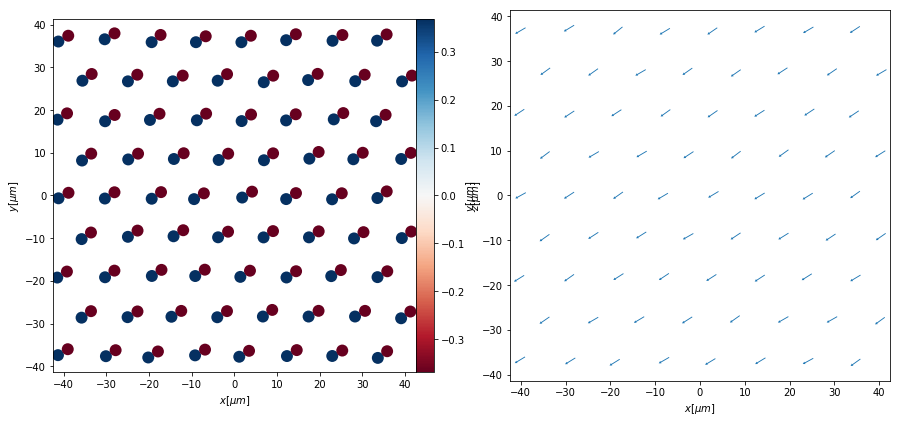

In [9]:
fig, ax = plt.subplots(1,2,figsize = (15,10))

frame = 50
mgc.draw_trj(trj,sim,iframe=frame, ax = ax[0]);
mgc.draw_dim(dim,sim,iframe=frame, ax = ax[1]);

The dimer array needs some modifications for saving it properly, mostly due to a bad design in the pandas structure.

In [10]:
def save_dimer_array(dim,cat):
    dim["member_a"] = np.array([list(m) for m in dim.members])[:,0]
    dim["member_b"] = np.array([list(m) for m in dim.members])[:,1]

    dim["x"] = np.array([m for m in dim.center])[:,0]
    dim["y"] = np.array([m for m in dim.center])[:,1]
    dim["z"] = np.array([m for m in dim.center])[:,2]

    dim["dx"] = np.array([m for m in dim.direction])[:,0]
    dim["dy"] = np.array([m for m in dim.direction])[:,1]
    dim["dz"] = np.array([m for m in dim.direction])[:,2]

    dim_store = dim.filter(["member_a","member_b","x","y","z","dx","dy","dz"])
    
    dim_store.to_csv(os.path.join(directory,cat["name"])+"_dimers.dat",sep = "\t")
    return dim_store
    
dim_store = save_dimer_array(dim,cat)

In [11]:
def count_dimers(trj,dim_store,cat):
    frames = trj.index.get_level_values("frame").unique()

    dimer_statistics = pd.DataFrame(index = frames)
    dimer_statistics["number"] = dim_store.groupby("frame").count().x
    dimer_statistics[dimer_statistics.number.isna()]=0

    dimer_statistics = pd.concat([dimer_statistics], keys=[cat["name"]], names=['names'])
    
    return dimer_statistics
count_dimers(trj,dim_store,cat).head()

number
names                          frame        
param_grid_2019_01_19_14_10_51 0        72.0
                               133      72.0
                               266      72.0
                               399      72.0
                               532      72.0

# Now do all these steps for all the simulation results

In [14]:
from tqdm import tqdm_notebook

In [12]:
def process_trj(cat):
    
    sim = run_simulation(packing = cat.phi, height = cat.h)
    
    trj = mgc.trj_lazyread(os.path.join(directory,cat["name"])+".lammpstrj",output = ["x","y","z","mux","muy","muz","fx","fy"])
    trj = trj.read_trj()
    
    dim = mgc.dimers(trj,sim,distance = 3)
    dim = mgc.dimers_findpositions(dim,trj,sim)
    
    dim_store = save_dimer_array(dim,cat)
    
    return count_dimers(trj,dim_store,cat)

In [24]:
dimer_statistics = pd.concat([process_trj(cat) for i,cat in tqdm_notebook(catalogue.iterrows())])

A Jupyter Widget

In [26]:
dimer_statistics.to_csv(os.path.join(directory,"dimer_statistics.dat"),sep="\t")

In [27]:
dimer_statistics.head()

number
names                          frame        
param_grid_2019_01_18_18_23_28 0        72.0
                               133       0.0
                               266       0.0
                               399       0.0
                               532       0.0

# Review Dimer Statistics

In [28]:
dimer_statistics = pd.read_csv(os.path.join(directory,"dimer_statistics.dat"),sep="\t",index_col=[0,1])
dimer_statistics.head()

C:\ProgramFiles\Anaconda3\lib\site-packages\numpy\lib\arraysetops.py:472: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


number
names                          frame        
param_grid_2019_01_18_18_23_28 0        72.0
                               133       0.0
                               266       0.0
                               399       0.0
                               532       0.0

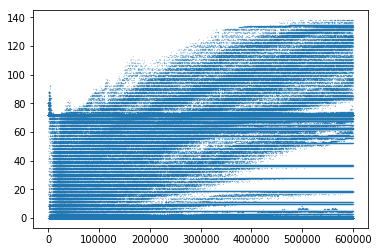

In [130]:
plt.plot(dimer_statistics.index.get_level_values("frame"),dimer_statistics.number,'.',markersize=0.2);

In [35]:
frame_properties = pd.DataFrame(index = dimer_statistics.index)
frame_properties["mostly_dimers"] = (dimer_statistics.number>=67) & (dimer_statistics.number<77)
frame_properties.head()

mostly_dimers
names                          frame               
param_grid_2019_01_18_18_23_28 0               True
                               133            False
                               266            False
                               399            False
                               532            False

## Synchronous-Asynchronous
persistent_dimers is true for all experiments which have dimers all through the run time. It means that the system goes from synchronous rotation to asynchronous rotation keeping it's structure

In [51]:
experiment_properties = pd.DataFrame(index=catalogue.name)

experiment_properties["phi"] = catalogue.phi.values
experiment_properties["h"] = catalogue.h.values

experiment_properties["persistent_dimers"] = frame_properties.groupby("names").all()

In [52]:
experiment_properties.head()

,phi,h,persistent_dimers
name,,,
param_grid_2019_01_18_18_23_28,0.050000,2.8,False
param_grid_2019_01_18_18_27_57,0.073684,2.8,False
param_grid_2019_01_18_18_33_18,0.097368,2.8,False
param_grid_2019_01_18_18_39_39,0.121053,2.8,False
param_grid_2019_01_18_18_46_37,0.144737,2.8,False


In [108]:
help(mgc.draw_exp_phase_diagram)

Help on function draw_exp_phase_diagram in module magcolloid.support:

draw_exp_phase_diagram(ax=False)



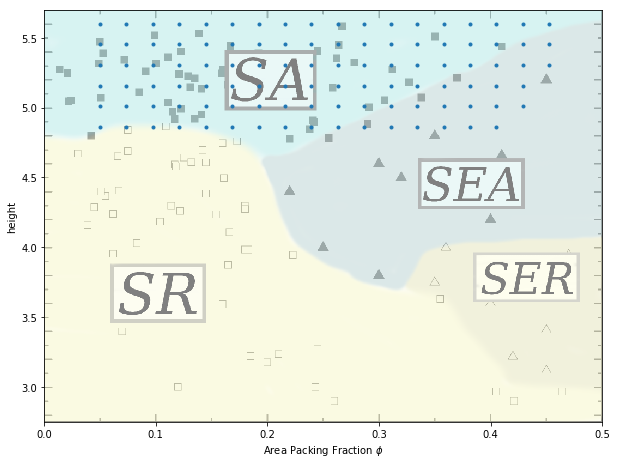

In [100]:
ax = mgc.draw_exp_phase_diagram()

ax.plot(experiment_properties[experiment_properties.persistent_dimers].phi,
         experiment_properties[experiment_properties.persistent_dimers].h,'.');

### An example

In [112]:
APoint = experiment_properties[
    (experiment_properties.phi==experiment_properties.phi.unique()[-5]) &
    (experiment_properties.h == experiment_properties.h.unique()[-5])]
APoint

,phi,h,persistent_dimers
name,,,
param_grid_2019_01_21_06_25_42,0.405263,5.010526,True


In [ ]:
def review_exp(SinglePoint,start=0,end=10,step=10,speedup=5):

    fig, ax = plt.subplots(1,1,figsize=(3,3))
    
    mgc.draw_exp_phase_diagram(ax=ax)
    plt.plot(SinglePoint.phi,SinglePoint.h,'.',color='r')

    sim = run_simulation(packing = SinglePoint.phi, height = OneFalsePoint.h)
    trj = mgc.trj_lazyread(os.path.join(directory,SinglePoint.index[0])+".lammpstrj",
                           output = ["x","y","z","mux","muy","muz","fx","fy"])
    trj = trj.read_trj()

    return mgc.display_animation_direct(sim,trj,start=start,end = end,step=step,speedup=speedup)

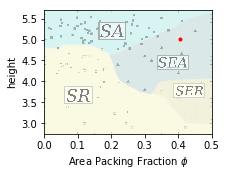

In [113]:
HTML(review_exp(APoint,end = 30))

# Totally Ruptured States

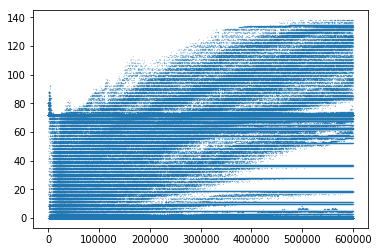

In [346]:
plt.plot(dimer_statistics.index.get_level_values("frame"),dimer_statistics.number,'.',markersize=0.2);

In [359]:
frame_properties["mostly_broken"] = dimer_statistics.number<=0

In [360]:
def ruptured_finish(series):
    return series[-75:].mostly_broken.all()

In [361]:
experiment_properties["ruptured_finish"] = frame_properties.groupby("names").apply(ruptured_finish)

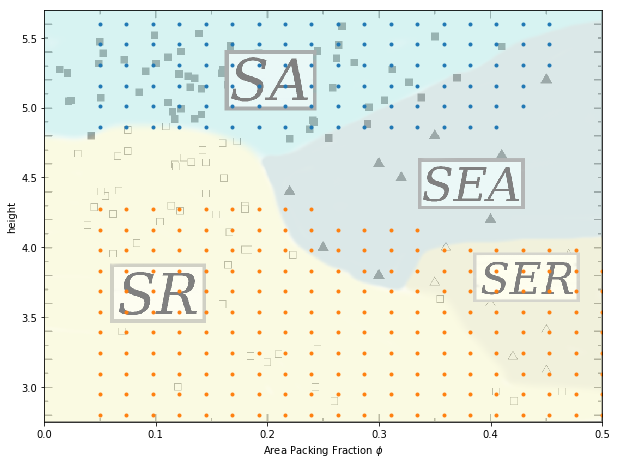

In [362]:
ax = mgc.draw_exp_phase_diagram()

ax.plot(experiment_properties[experiment_properties.persistent_dimers].phi,
         experiment_properties[experiment_properties.persistent_dimers].h,'.');

ax.plot(experiment_properties[experiment_properties.ruptured_finish].phi,
         experiment_properties[experiment_properties.ruptured_finish].h,'.');

# Distinguish SR from SER

* Exchange means a particle is member of different dimers at different times. 
* Worms happen when particles are members of different dimers *at the same time*

In [351]:
import networkx as nx

def overall_dimer_network_max_degree(cat):

    dim = pd.read_csv(os.path.join(directory,cat["name"]+"_dimers.dat"),sep="\t", index_col = [0,1])

    dimer_members = dim.filter(["member_a","member_b"])
    dimer_members["frame"] = dimer_members.index.get_level_values("frame")
    dimer_members["id"] = dimer_members.index.get_level_values("id")

    dimer_graph = nx.Graph()

    dimer_graph.add_nodes_from(pd.concat([dimer_members.member_a,dimer_members.member_b]).unique())

    dimer_graph.add_edges_from(dimer_members.loc[idx[:,:],["member_a","member_b"]].values)

    return max(np.array(list(dimer_graph.degree().values())))

In [352]:
experiment_properties["max_degree"] = [overall_dimer_network_max_degree(cat) for i,cat in tqdm_notebook(catalogue.iterrows())]

A Jupyter Widget

In [353]:
experiment_properties["many_exchanges"] = experiment_properties.max_degree>4

In [433]:
experiment_properties["phase_val"] = np.NaN

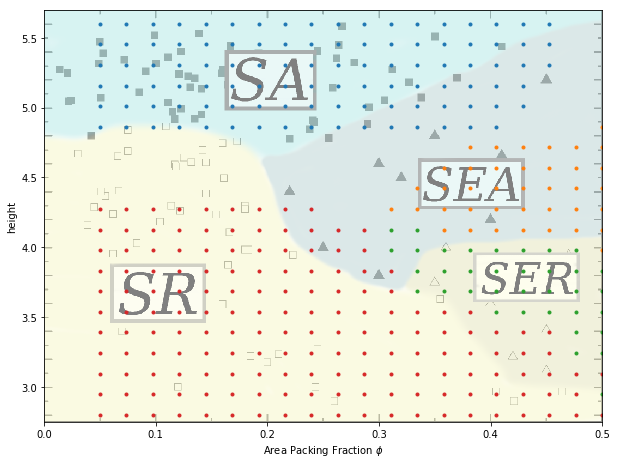

In [434]:
experiment_properties["phase_val"] = np.NaN

ax = mgc.draw_exp_phase_diagram()

SA = experiment_properties.persistent_dimers
experiment_properties.loc[SA,"phase_val"] = 1

ax.plot(experiment_properties[SA].phi,experiment_properties[SA].h,'.');

SEA = (~experiment_properties.ruptured_finish) & experiment_properties.many_exchanges
experiment_properties.loc[SEA,"phase_val"] = 0

ax.plot(experiment_properties[SEA].phi,experiment_properties[SEA].h,'.');

SER = experiment_properties.ruptured_finish & experiment_properties.many_exchanges
experiment_properties.loc[SER,"phase_val"] = 3

ax.plot(experiment_properties[SER].phi,experiment_properties[SER].h,'.');

SR = (experiment_properties.ruptured_finish) & (~experiment_properties.many_exchanges)
experiment_properties.loc[SR,"phase_val"] = 2

ax.plot(experiment_properties[SR].phi,experiment_properties[SR].h,'.');

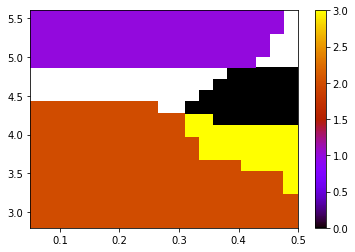

In [435]:
import numpy.ma as ma

array = np.reshape(experiment_properties.filter(["phi","h","phase_val"]).values,[20,20,3])

Zm = ma.masked_invalid(array[:,:,2])
plt.pcolormesh(array[:,:,0],array[:,:,1], Zm, cmap = "gnuplot");

plt.colorbar();

# Add Experimental Points

In [493]:
exp_phase = pd.read_csv("experimental_diagram_h_d_new.dat", sep = "\t")
exp_phase = exp_phase.rename(columns={"Densidad (%)":"phi", "h(um)":"h", "fase":"phase_value"})
exp_phase.phi = exp_phase.phi/100
exp_phase.head()

,phi,h,phase_value
0,0.099,5.520854,1
1,0.139,5.534208,1
2,0.190,5.291089,1
3,0.085,5.111170,1
4,0.051,5.073825,1


In [505]:
exp_phase["phase"] = ""
exp_phase.loc[exp_phase.phase_value==1,"phase"] = "SA"
exp_phase.loc[exp_phase.phase_value==2,"phase"] = "SR"
exp_phase.loc[exp_phase.phase_value==3,"phase"] = "SEA"
exp_phase.loc[exp_phase.phase_value==4,"phase"] = "SER"

In [506]:
exp_phase.loc[exp_phase.phase == "SA","phase_value"] = 1
exp_phase.loc[exp_phase.phase == "SR","phase_value"] = 2
exp_phase.loc[exp_phase.phase == "SEA","phase_value"] = 0
exp_phase.loc[exp_phase.phase == "SER","phase_value"] = 3

# Number of Dimers at the end

In [501]:
frame_properties["number_of_dimers"] = dimer_statistics.number

def dimers_at_end(series):
    return series[-75:].number_of_dimers.mean()

experiment_properties["dimers_at_end"] = frame_properties.groupby("names").apply(dimers_at_end)

experiment_properties.head()

,phi,h,persistent_dimers,ruptured_finish,max_degree,many_exchanges,phase_val,dimers_at_end
name,,,,,,,,
param_grid_2019_01_18_18_23_28,0.050000,2.8,False,True,1,False,2.0,0.0
param_grid_2019_01_18_18_27_57,0.073684,2.8,False,True,1,False,2.0,0.0
param_grid_2019_01_18_18_33_18,0.097368,2.8,False,True,1,False,2.0,0.0
param_grid_2019_01_18_18_39_39,0.121053,2.8,False,True,1,False,2.0,0.0
param_grid_2019_01_18_18_46_37,0.144737,2.8,False,True,1,False,2.0,0.0


In [502]:
experiment_properties.loc[experiment_properties.phase_val.isna(),"phase_val"] = \
    2-experiment_properties[experiment_properties.phase_val.isna()].dimers_at_end/72

In [530]:
font_size = 12
plt.rc('text', usetex=True)
plt.rc('font', size=font_size)

#### Create custom colormap

In [597]:
from matplotlib.colors import LinearSegmentedColormap

colors = [(1,0.4,1),(1, 0.4, 0.4), (0.4, 0.4, 1),(0.5,1,1)]
n_bins = [3, 6, 10, 100]
cmap_name = 'my_list'

cm_back = LinearSegmentedColormap.from_list(
    cmap_name, colors, N=256)

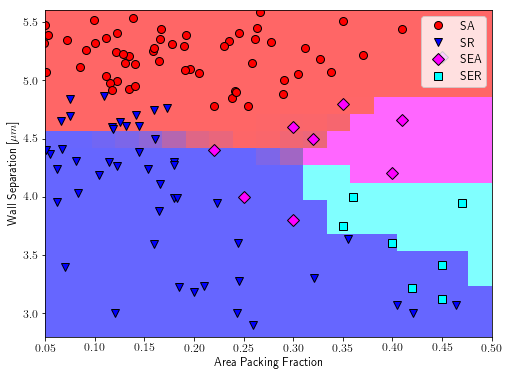

In [599]:
import numpy.ma as ma

fig, ax = plt.subplots(1,1,figsize=(8,6))
array = np.reshape(experiment_properties.filter(["phi","h","phase_val"]).values,[20,20,3])

Zm = ma.masked_invalid(array[:,:,2])
plt.pcolormesh(array[:,:,0],array[:,:,1], Zm, cmap = cm_back);
#plt.scatter(exp_phase.phi,exp_phase.h,c = exp_phase.phase_value,
#            cmap = cm, edgecolors = "white")

plt.plot(exp_phase[exp_phase.phase == "SA"].phi,exp_phase[exp_phase.phase == "SA"].h,
        'o',color = "red",markeredgecolor = "black",markersize = 8,label = "SA")

plt.plot(exp_phase[exp_phase.phase == "SR"].phi,exp_phase[exp_phase.phase == "SR"].h,
        'v',color = "blue",markeredgecolor = "black",markersize = 8,label = "SR")

plt.plot(exp_phase[exp_phase.phase == "SEA"].phi,exp_phase[exp_phase.phase == "SEA"].h,
        'D',color = "magenta",markeredgecolor = "black",markersize = 8,label = "SEA")

plt.plot(exp_phase[exp_phase.phase == "SER"].phi,exp_phase[exp_phase.phase == "SER"].h,
        's',color = "cyan",markeredgecolor = "black",markersize = 8,label = "SER")

plt.legend()
plt.xlim(0.05,0.5)
plt.ylim(2.8,5.6)
plt.xlabel(r"Area Packing Fraction")
plt.ylabel(r"Wall Separation [$\mu{}m$]")

fig.savefig("state_diagram.pdf", bbox_inches='tight')

# Review some individual points

### A point with experimental SEA but simulation SA

In [522]:
OneFalsePoint = experiment_properties[
    (experiment_properties.phi==experiment_properties.phi.unique()[8]) &
    (experiment_properties.h == experiment_properties.h.unique()[-8])]
OneFalsePoint

,phi,h,persistent_dimers,ruptured_finish,max_degree,many_exchanges,phase_val,dimers_at_end
name,,,,,,,,
param_grid_2019_01_20_17_35_33,0.239474,4.568421,False,False,1,False,1.0,72.0


C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


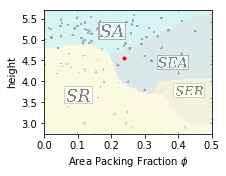

In [523]:
HTML(review_exp(OneFalsePoint,end = 30))

If these had a bias, maybe they would exchange.

### A point with experimental SEA but simulation SR

In [528]:
OneFalsePoint = experiment_properties[
    (experiment_properties.phi==experiment_properties.phi.unique()[9]) &
    (experiment_properties.h == experiment_properties.h.unique()[8])]
OneFalsePoint

,phi,h,persistent_dimers,ruptured_finish,max_degree,many_exchanges,phase_val,dimers_at_end
name,,,,,,,,
param_grid_2019_01_20_02_21_49,0.263158,3.978947,False,True,4,False,2.0,0.0


C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


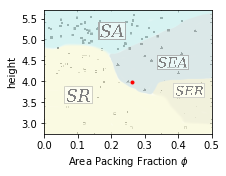

In [529]:
HTML(review_exp(OneFalsePoint,end = 30))

In [444]:
OneFalsePoint = experiment_properties[
    (experiment_properties.phi==experiment_properties.phi.unique()[-2]) &
    (experiment_properties.h == experiment_properties.h.unique()[-6])]
OneFalsePoint

,phi,h,persistent_dimers,ruptured_finish,max_degree,many_exchanges,phase_val,dimers_at_end
name,,,,,,,,
param_grid_2019_01_21_03_26_11,0.476316,4.863158,False,False,3,False,1.0,72.0


C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


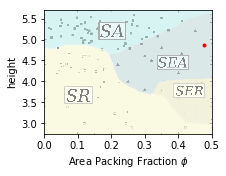

In [445]:
HTML(review_exp(OneFalsePoint,end = 30))

In [440]:
OneFalsePoint = experiment_properties[
    (experiment_properties.phi==experiment_properties.phi.unique()[-1]) &
    (experiment_properties.h == experiment_properties.h.unique()[-6])]
OneFalsePoint

,phi,h,persistent_dimers,ruptured_finish,max_degree,many_exchanges,phase_val,dimers_at_end
name,,,,,,,,
param_grid_2019_01_21_03_43_59,0.5,4.863158,False,False,5,True,0.0,135.0


C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


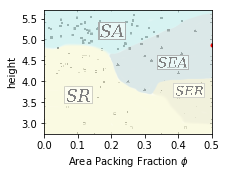

In [441]:
HTML(review_exp(OneFalsePoint,end = 30))

In [442]:
OneFalsePoint = experiment_properties[
    (experiment_properties.phi==experiment_properties.phi.unique()[4]) &
    (experiment_properties.h == experiment_properties.h.unique()[-9])]
OneFalsePoint

,phi,h,persistent_dimers,ruptured_finish,max_degree,many_exchanges,phase_val,dimers_at_end
name,,,,,,,,
param_grid_2019_01_20_13_09_59,0.144737,4.421053,False,False,1,False,1.736111,19.0


C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


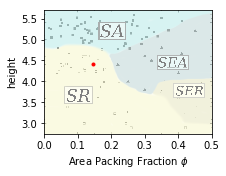

In [358]:
HTML(review_exp(OneFalsePoint,end = 30))

In [367]:
OneFalsePoint = experiment_properties[
    (experiment_properties.phi==experiment_properties.phi.unique()[-1]) &
    (experiment_properties.h == experiment_properties.h.unique()[4])]
OneFalsePoint

,phi,h,persistent_dimers,ruptured_finish,max_degree,many_exchanges
name,,,,,,
param_grid_2019_01_19_13_22_02,0.5,3.389474,False,True,6,True


C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
C:\ProgramFiles\Anaconda3\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


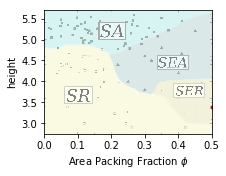

In [368]:
HTML(review_exp(OneFalsePoint,end = 30))